In [1]:
using Revise
using LilGuys
using CairoMakie, Arya

In [2]:
modelsdir = "/astro/dboyea/dwarfs/models/"

"/astro/dboyea/dwarfs/models/"

In [3]:
function load_profiles(filename, parampath=nothing; extension="_stars_profiles.hdf5")
    path = joinpath(modelsdir, filename * extension)

    if parampath === nothing
        parampath = joinpath(modelsdir, filename * ".toml")
    end
        
    if isfile(parampath)
        expected = LilGuys.load_profile(parampath)
    else
        expected = nothing
    end

    profs = LilGuys.read_structs_from_hdf5(path, LilGuys.StellarProfile3D)
    idxs = parse.(Int, first.(profs))
    profs = last.(profs)

    s = sortperm(idxs)
    return [idxs[i] => profs[i] for i in s ], expected
end

load_profiles (generic function with 2 methods)

In [4]:
function compare_profiles(profiles, expected=nothing; sequential=false, kwargs...)
    fig = Figure()

	ax = Axis(fig[1,1], xlabel=L"\log\, r / \textrm{kpc}", ylabel =  L"\log\, \rho_\star\; [10^{10} M_\odot / \textrm{kpc}^3]", 
		limits=((-1.5, 0.8), (-15, 3)); kwargs...
		)

    plot_kwargs = Dict{Symbol, Any}()

    if sequential
        plot_kwargs[:colorrange] = (1, length(profiles))
    end
    
    for i in eachindex(profiles)
        label, prof = profiles[i]
        x = prof.log_r
        y = log10.(prof.rho)
        if sequential
            plot_kwargs[:color] = i
        end

    	lines!(x, y, label=string(label); plot_kwargs...)
    end

    if expected !== nothing
    	log_r_pred = LinRange(-2, 2, 1000)
    	ρ_s_pred = calc_ρ.(expected, 10 .^ log_r_pred)

    	lines!(log_r_pred, log10.(ρ_s_pred), label="expected", color="black", linestyle=:dot)
    end
    
	axislegend(ax, position=:lb)
	fig
end

compare_profiles (generic function with 2 methods)

In [5]:
function plot_v_t!(profiles; kwargs...)
	sigmas = [p.second.sigma_vx for p in profiles]

    t = [p.second.time for p in profiles] 
	scatterlines!(t * T2GYR, sigmas * V2KMS; kwargs...)
end

plot_v_t! (generic function with 1 method)

In [6]:
function plot_v_t(profiles; kwargs...)
	fig, ax = FigAxis(
		xlabel = "time / Gyr",
		ylabel = L"\sigma_v / \textrm{km s^{-1}}",
	)

    plot_v_t!(profiles; kwargs...)

    fig
end
    

plot_v_t (generic function with 1 method)

In [7]:
function compare_v_t(profilesi)
	fig, ax = FigAxis(
		xlabel = "time / Gyr",
		ylabel = L"\sigma_v / \textrm{km s^{-1}}",
	)


    for i in eachindex(profilesi)
        label, profiles = profilesi[i]

        kwargs = Dict{Symbol, Any}()
        kwargs[:label] = label
  
        plot_v_t!(profiles; kwargs...)
    end

    axislegend()
	fig
end

compare_v_t (generic function with 1 method)

In [43]:
function plot_r_percens(profiles; kwargs...)
	fig = Figure()
	ax = Axis(fig[1,1], xlabel="time / Gyr", ylabel="log r / kpc containing stellar mass"; kwargs...)

	q = profiles[1].second.quantiles
	t = [p.second.time for p in profiles] * T2GYR
    
	for i in reverse(eachindex(q))
		Mq = [log10.(p.second.r_quantile[i]) for p in profiles]
        
		lines!(t, Mq, color=q[i], colorrange=extrema(q), label="$(q[i])")
	end

	Legend(fig[1, 2], ax, "quantile")
	fig
end
    

plot_r_percens (generic function with 1 method)

In [9]:
function all_plots(profiles, expected=nothing)
    display(plot_r_percens(profiles))

    display(
        compare_profiles(profiles, expected, sequential=true)
        )
    
end

all_plots (generic function with 2 methods)

# 1e6 fiducial halo

In [13]:
model = "sculptor/isolation/1e6/fiducial"

"sculptor/isolation/1e6/fiducial"

In [10]:
ana_profs, _ = load_profiles(joinpath(model, "ana_stars/exp2d_rs0.10"));

In [11]:
pos_profs, expected = load_profiles(joinpath(model, "stars/exp2d_rs0.10"));

In [12]:
old_profs, _ = load_profiles(joinpath(model, "stars_old/exp2d_rs0.10"));

In [13]:
all_profs = [
    "emperical" => old_profs,
    "abs(emperical)" => pos_profs,
    "analytic" => ana_profs,
    ];

In [19]:
all_profs_end = [
    "emperical" => old_profs[end].second,
    "abs(emperical)" => pos_profs[end].second,
    "analytic" => ana_profs[end].second,
    ];

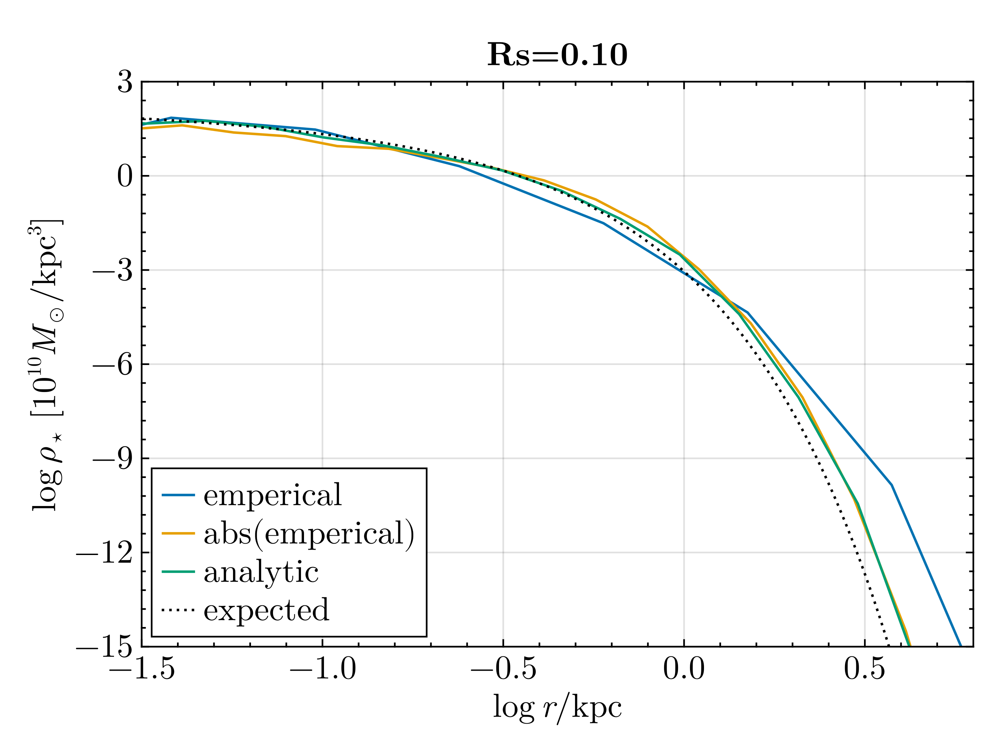

In [20]:
compare_profiles(all_profs_end, expected, title="Rs=0.10")

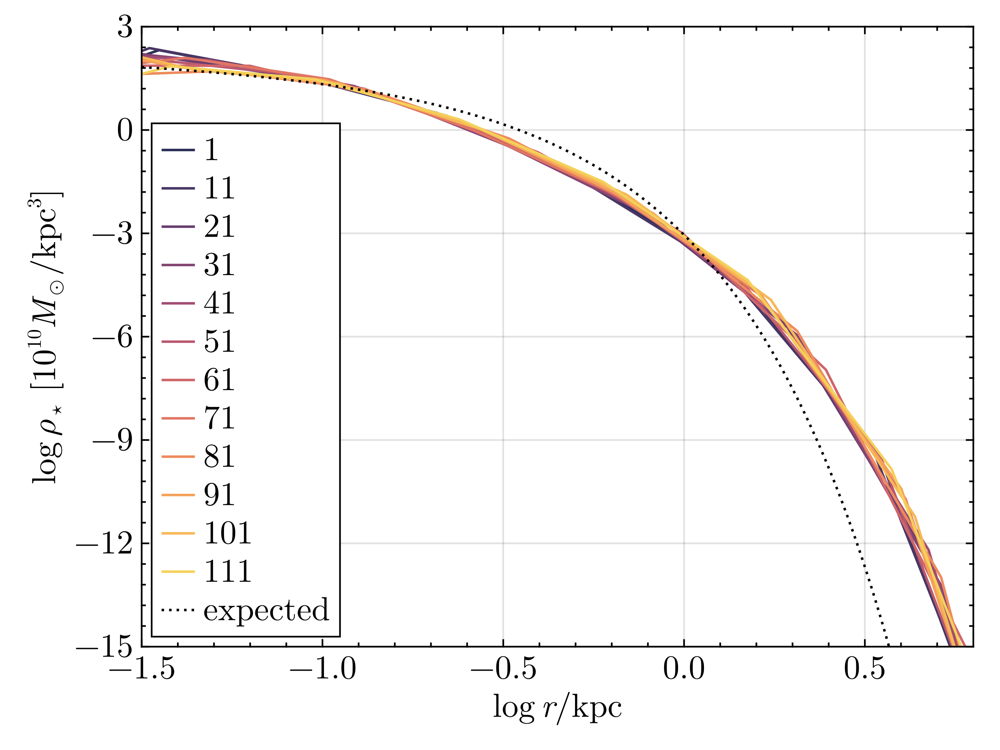

In [14]:
compare_profiles(old_profs, expected, sequential=true)

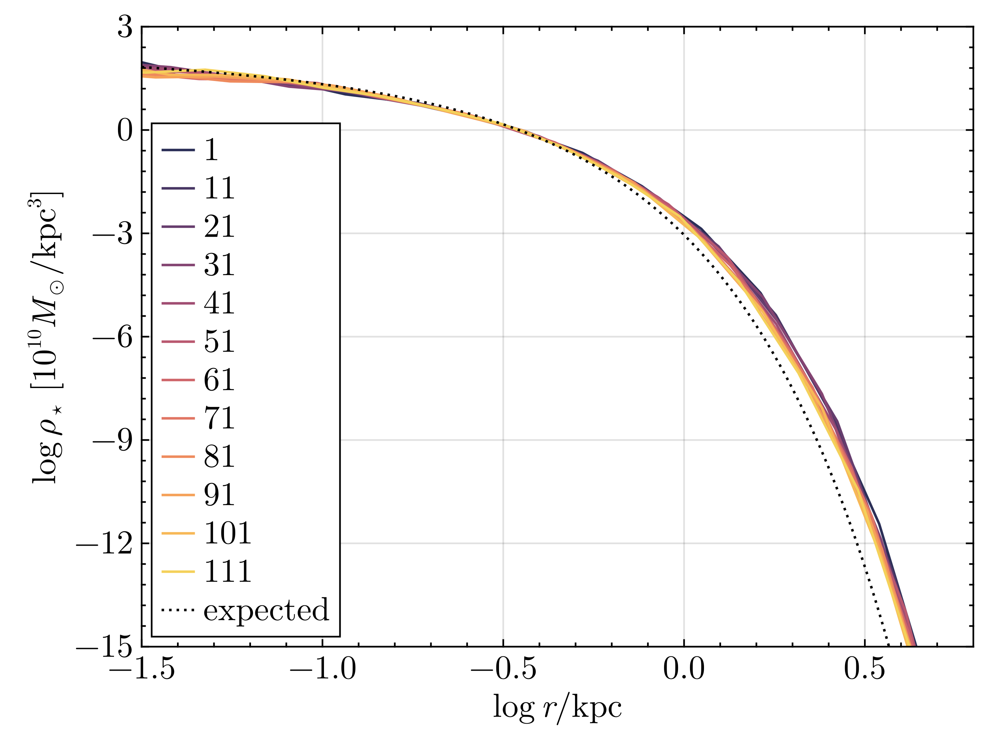

In [15]:
compare_profiles(ana_profs, expected, sequential=true)

### Rs = 0.05

In [55]:
ana_profs, _ = load_profiles(joinpath(model, "ana_stars/exp2d_rs0.10"));

In [56]:
profs, expected = load_profiles(joinpath(model, "stars/exp2d_rs0.10"));

In [58]:
profs_o, _ = load_profiles(joinpath(model, "stars_old/exp2d_rs0.10"));

In [61]:
all_profs_end = [
    "emperical" => profs_o[end].second,
    "abs(emperical)" => pos_profs[end].second,
    "analytic" => ana_profs[end].second,
    ];

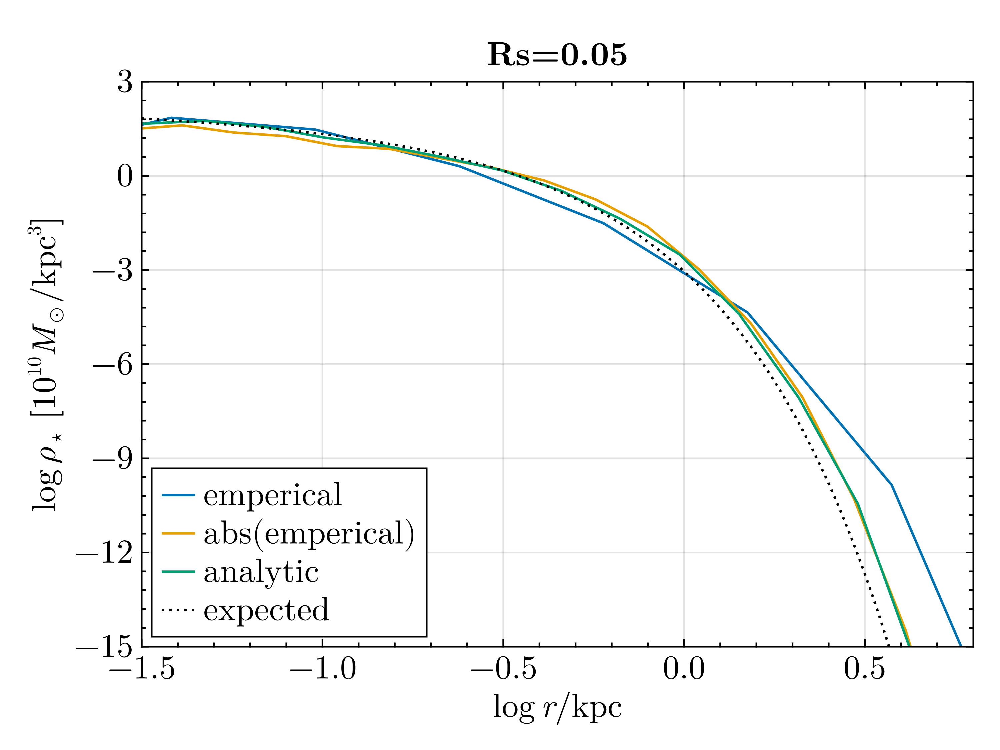

In [63]:
compare_profiles(all_profs_end, expected, title="Rs=0.05")

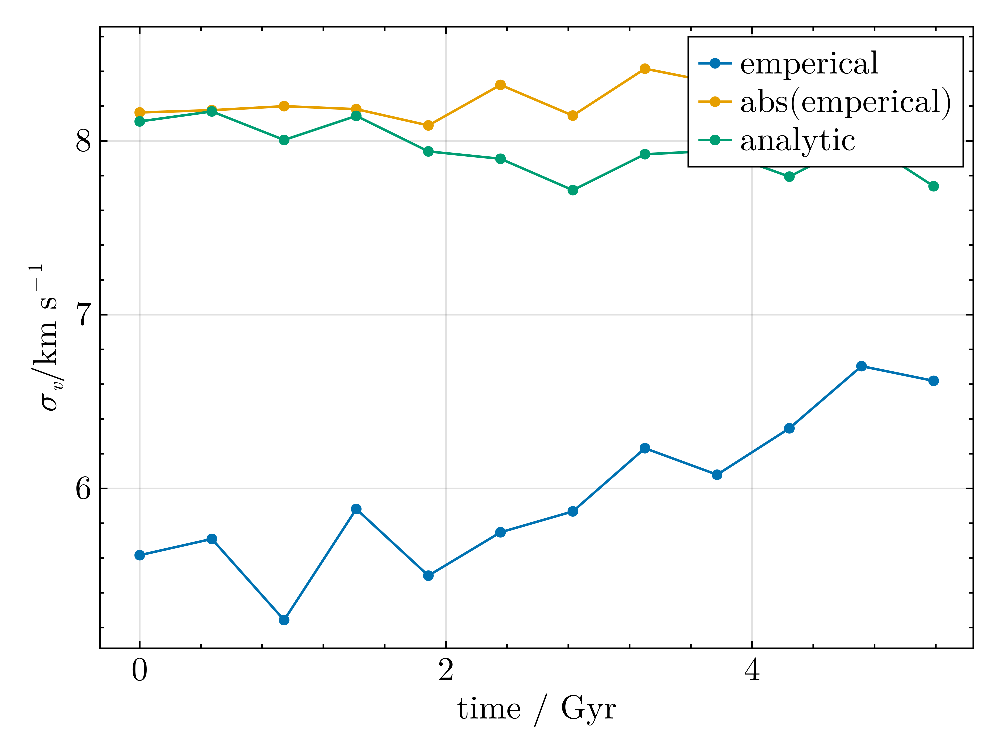

In [94]:
compare_v_t(all_profs, times_Gyr)


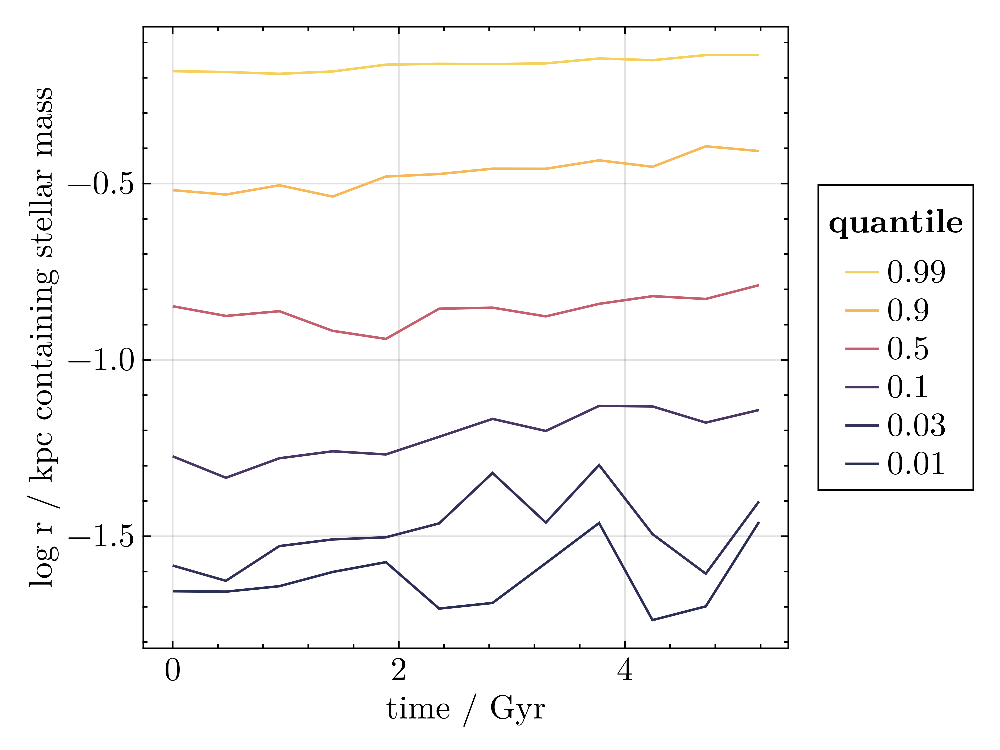

In [30]:
plot_r_percens(old_profs, times_Gyr)

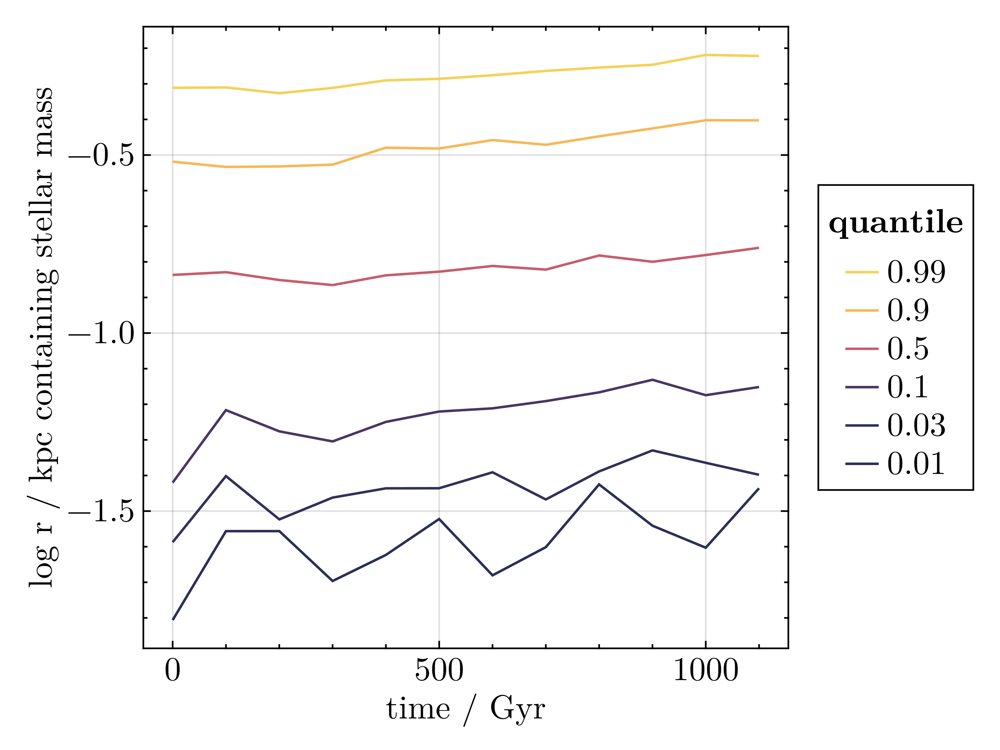

In [134]:
plot_r_percens(profs, idxs)

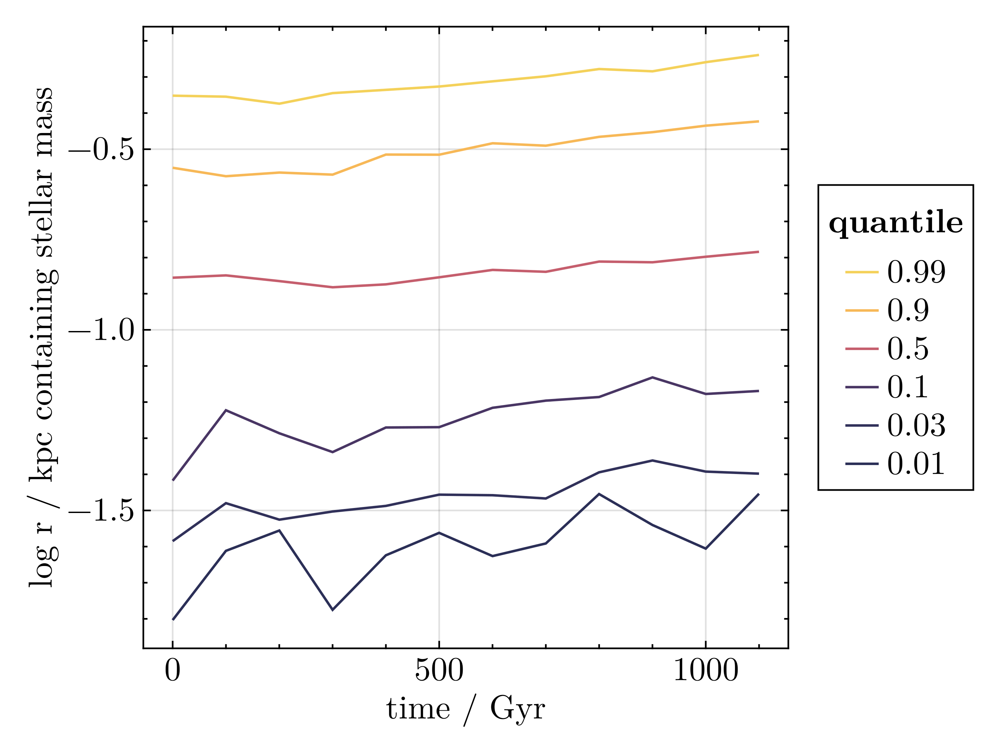

In [133]:
plot_r_percens(ana_profs, ana_idxs)

## King

### Rs=0.15

In [23]:
ana_profs, _ = load_profiles(joinpath(model, "stars_ana/king_rs0.15"));

In [24]:
pos_profs, expected = load_profiles(joinpath(model, "stars/king_rs0.15"));

In [25]:
old_profs, _ = load_profiles(joinpath(model, "stars_old/king_rs0.15"));

In [26]:
all_profs = [
    "emperical" => old_profs,
    "abs(emperical)" => pos_profs,
    "analytic" => ana_profs,
    ];

In [27]:
all_profs_end = [
    "emperical" => old_profs[end].second,
    "abs(emperical)" => pos_profs[end].second,
    "analytic" => ana_profs[end].second,
    ];

In [28]:
all_profs_begin = [
    "emperical" => old_profs[3].second,
    "abs(emperical)" => pos_profs[3].second,
    "analytic" => ana_profs[3].second,
    ];

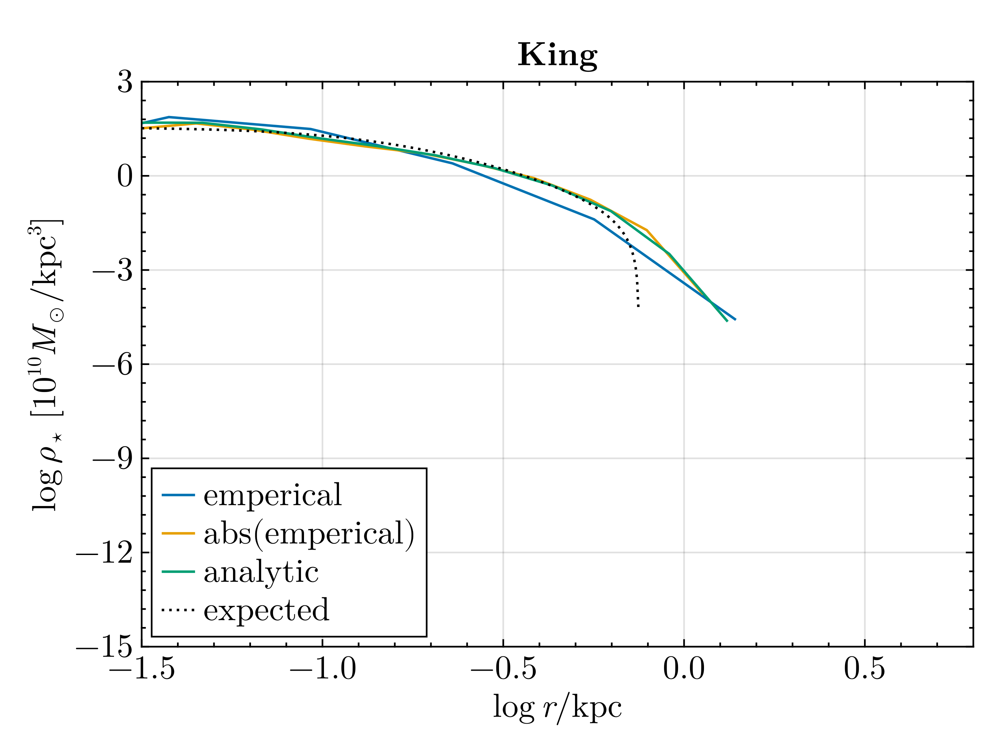

In [29]:
compare_profiles(all_profs_end, expected, title="King")

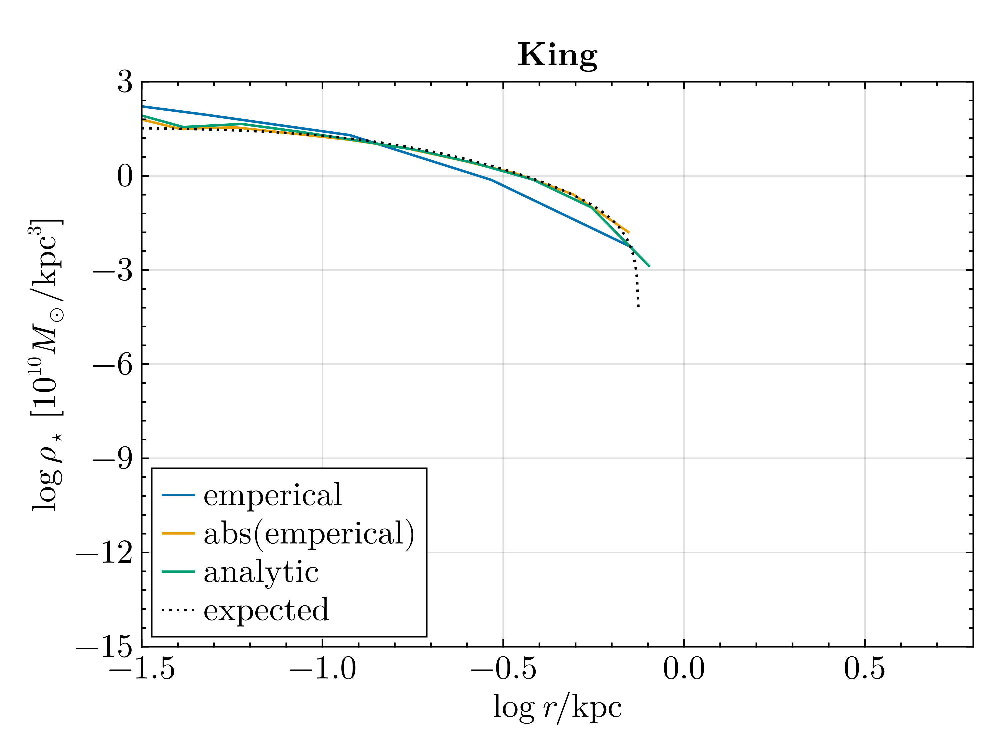

In [30]:
compare_profiles(all_profs_begin, expected, title="King")

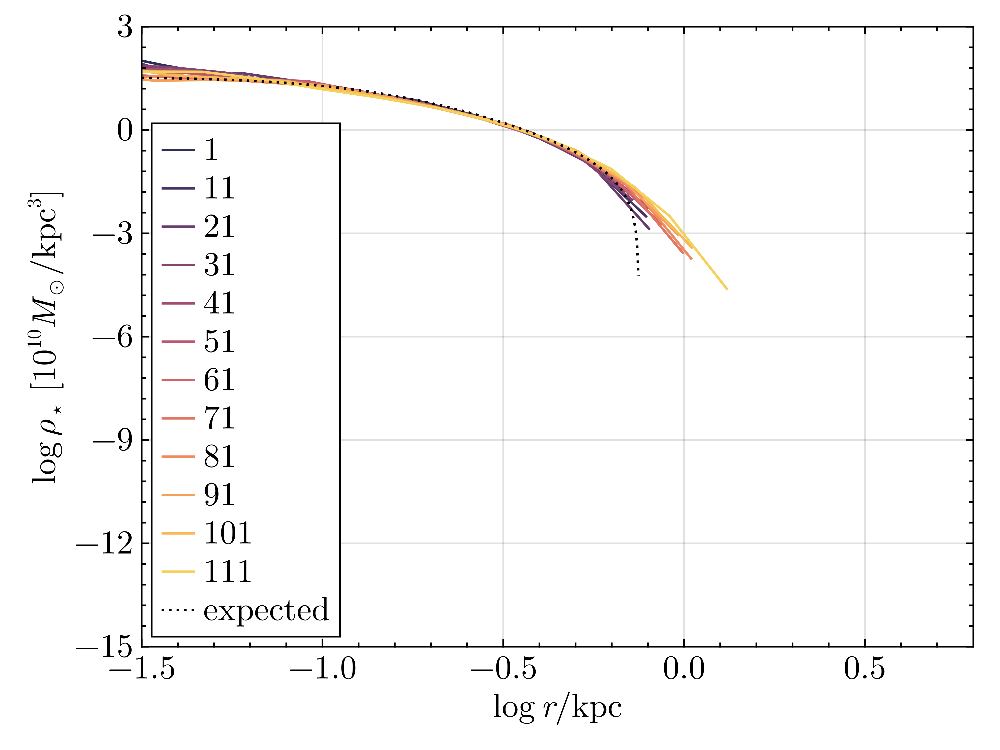

In [31]:
compare_profiles(ana_profs, expected, sequential=true)

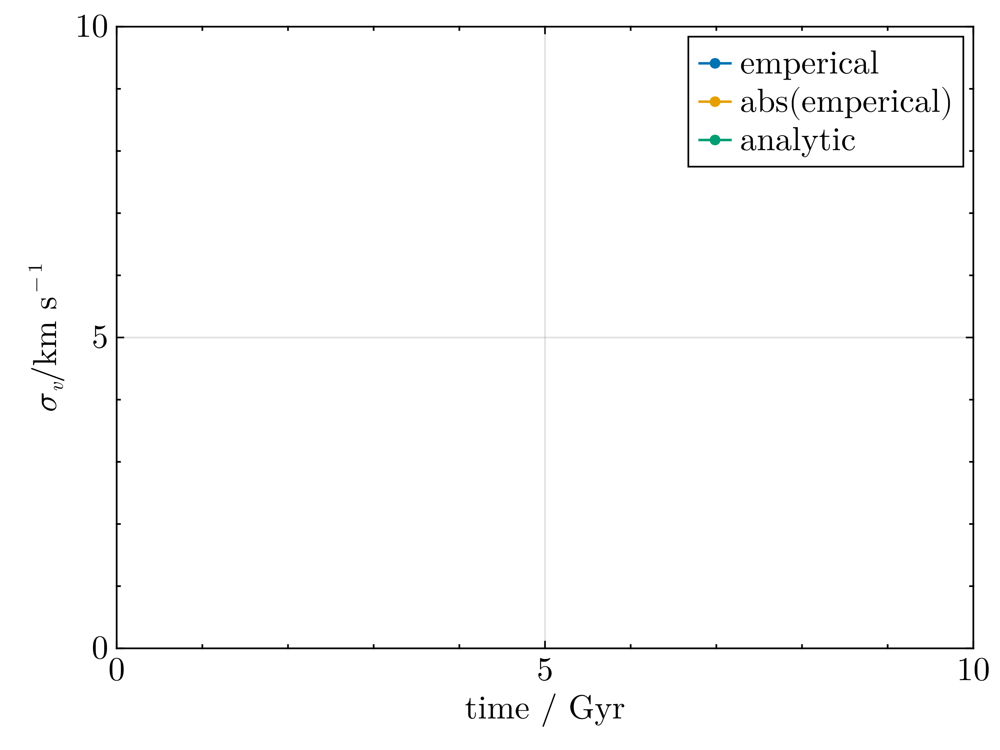

In [41]:
compare_v_t(all_profs)

### Rs=0.10

In [34]:
ana_profs, _ = load_profiles(joinpath(model, "stars_ana/king_rs0.10"));

In [35]:
pos_profs, expected = load_profiles(joinpath(model, "stars/king_rs0.10"));

In [36]:
old_profs, _ = load_profiles(joinpath(model, "stars_old/king_rs0.10"));

In [37]:
all_profs = [
    "emperical" => old_profs,
    "abs(emperical)" => pos_profs,
    "analytic" => ana_profs,
    ];

In [38]:
all_profs_end = [
    "emperical" => old_profs[end].second,
    "abs(emperical)" => pos_profs[end].second,
    "analytic" => ana_profs[end].second,
    ];

In [39]:
all_profs_begin = [
    "emperical" => old_profs[3].second,
    "abs(emperical)" => pos_profs[3].second,
    "analytic" => ana_profs[3].second,
    ];

In [40]:
compare_v_t([profs_o, profs, ana_profs], [idxs_o, idxs, ana_idxs], times_Gyr, ["emperical", "abs(emperical)", "analytic"])


LoadError: UndefVarError: `profs_o` not defined

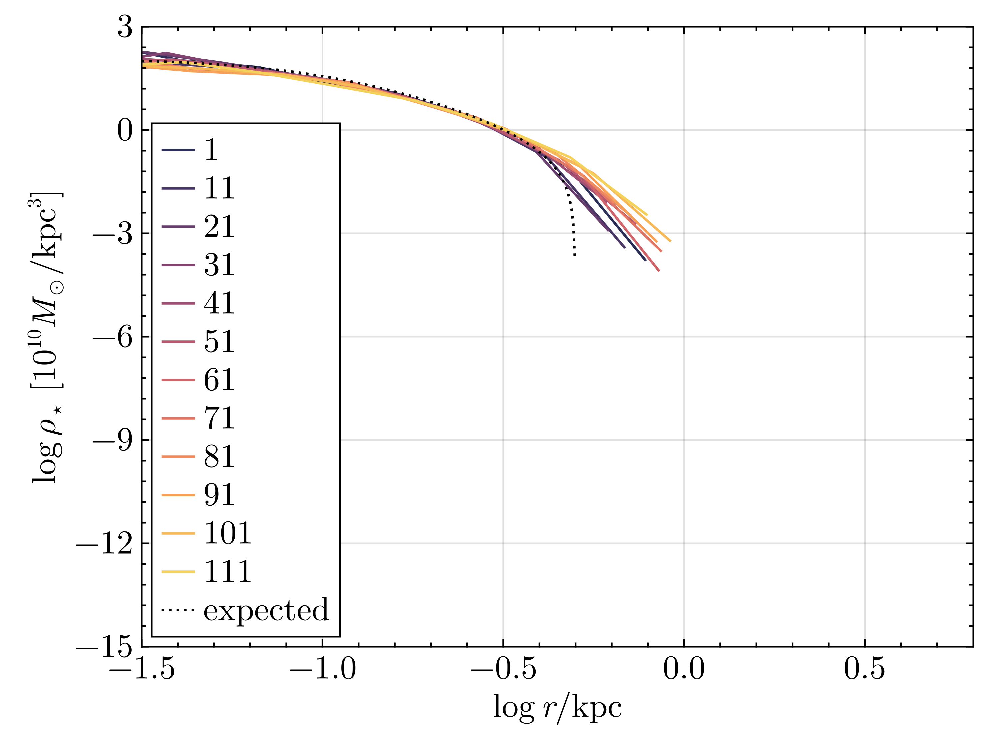

In [42]:
compare_profiles(ana_profs, expected, sequential=true)

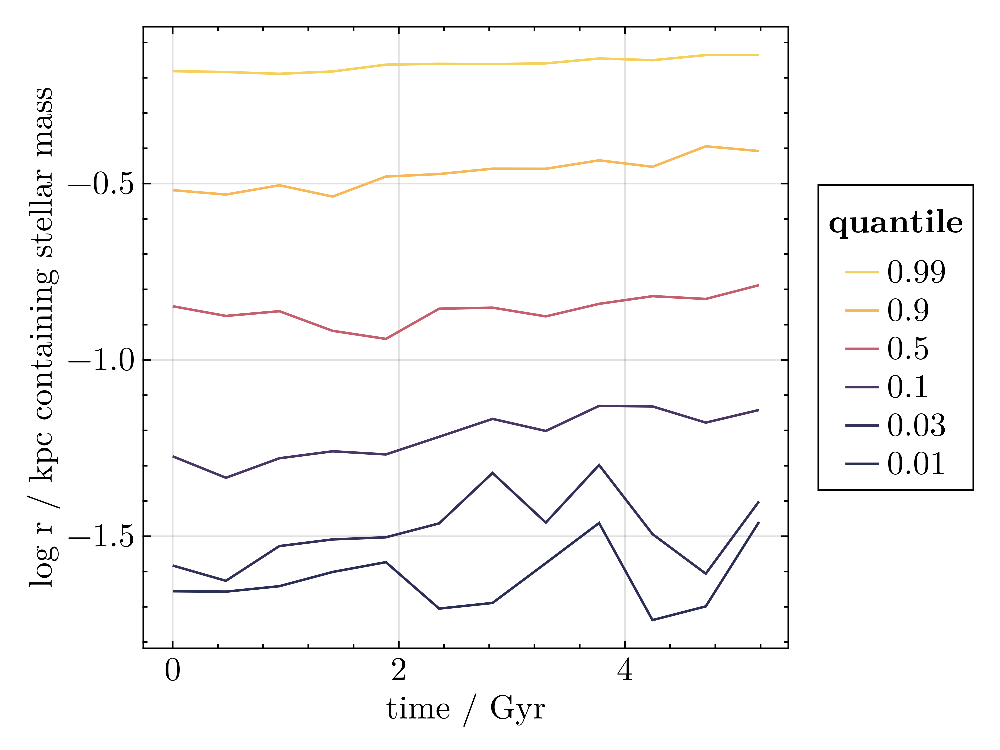

In [30]:
plot_r_percens(old_profs, times_Gyr)

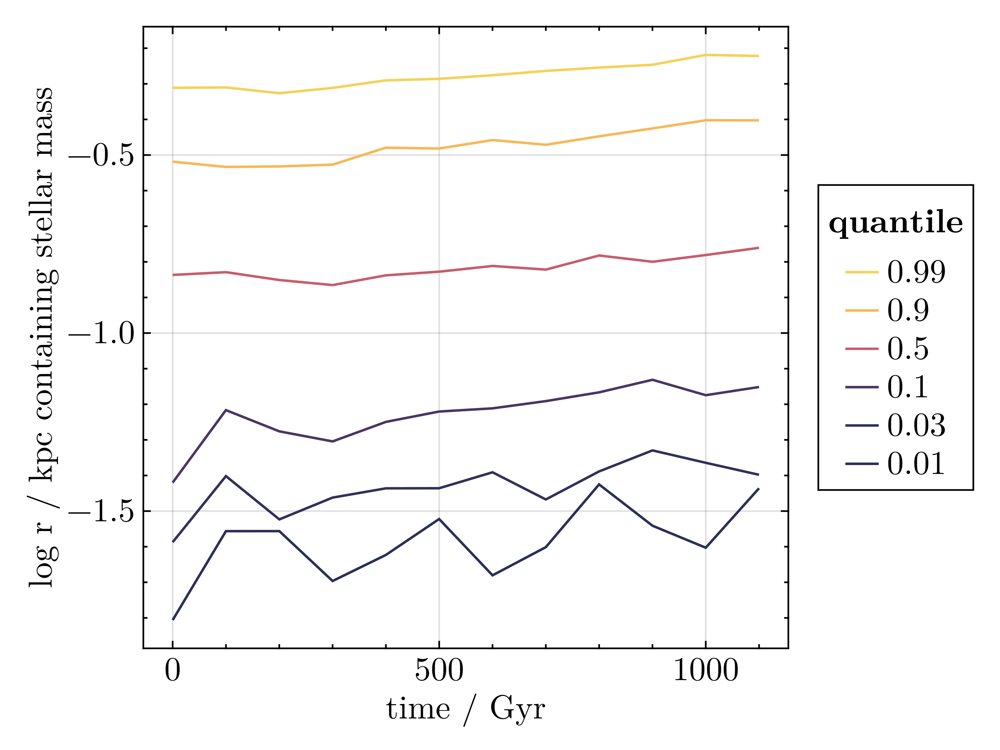

In [134]:
plot_r_percens(profs, idxs)

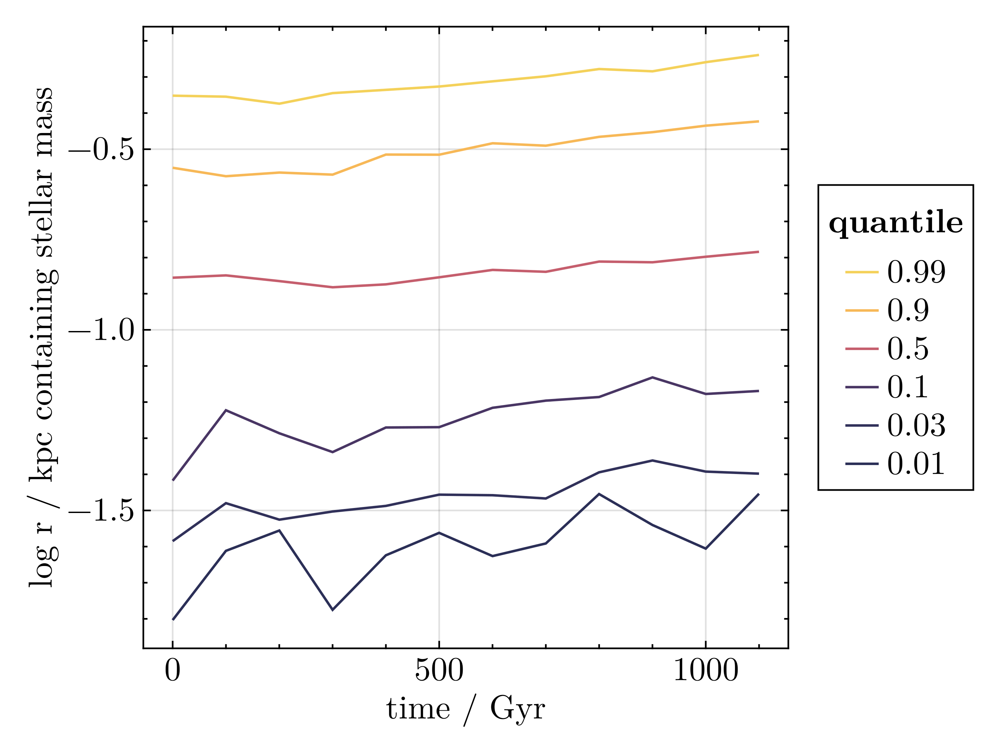

In [133]:
plot_r_percens(ana_profs, ana_idxs)

## king individual profiles

In [44]:
profs, expected = load_profiles(joinpath(model, "stars_ana/king_rs0.15"));

In [ ]:
all_plots(profs, expected)

## 1e6 ofther halos

In [80]:
model = "sculptor/isolation/1e6"

"sculptor/isolation/1e6"

In [81]:
profs, expected = load_profiles(joinpath(model, "s0.14/stars/exp2d_rs0.10"));

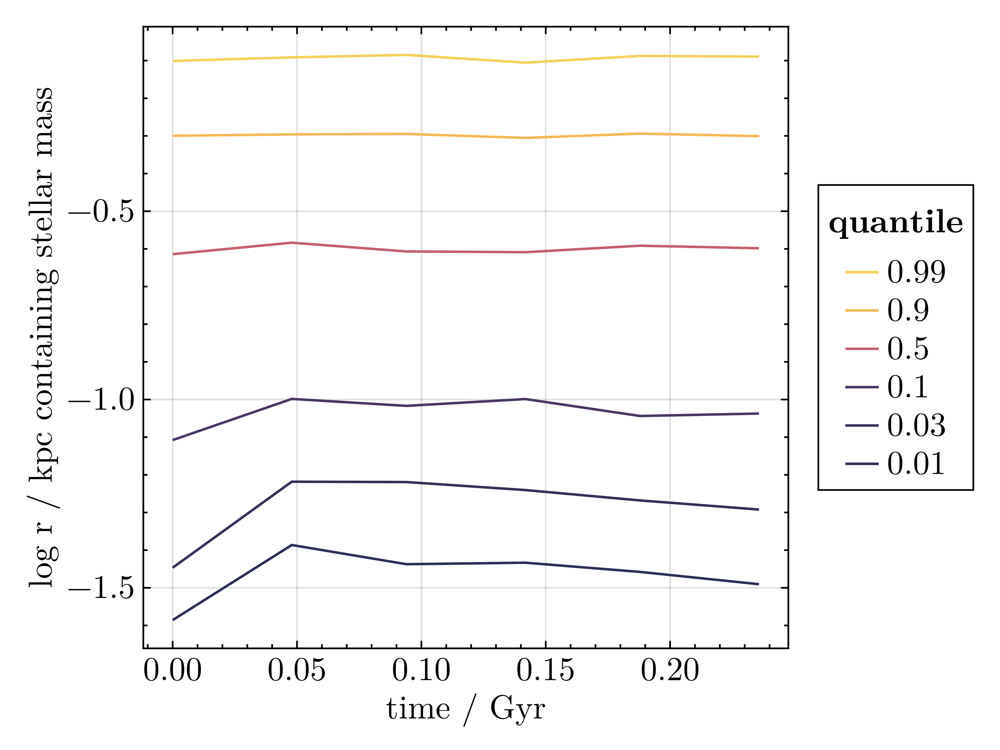

In [82]:
plot_r_percens(profs)

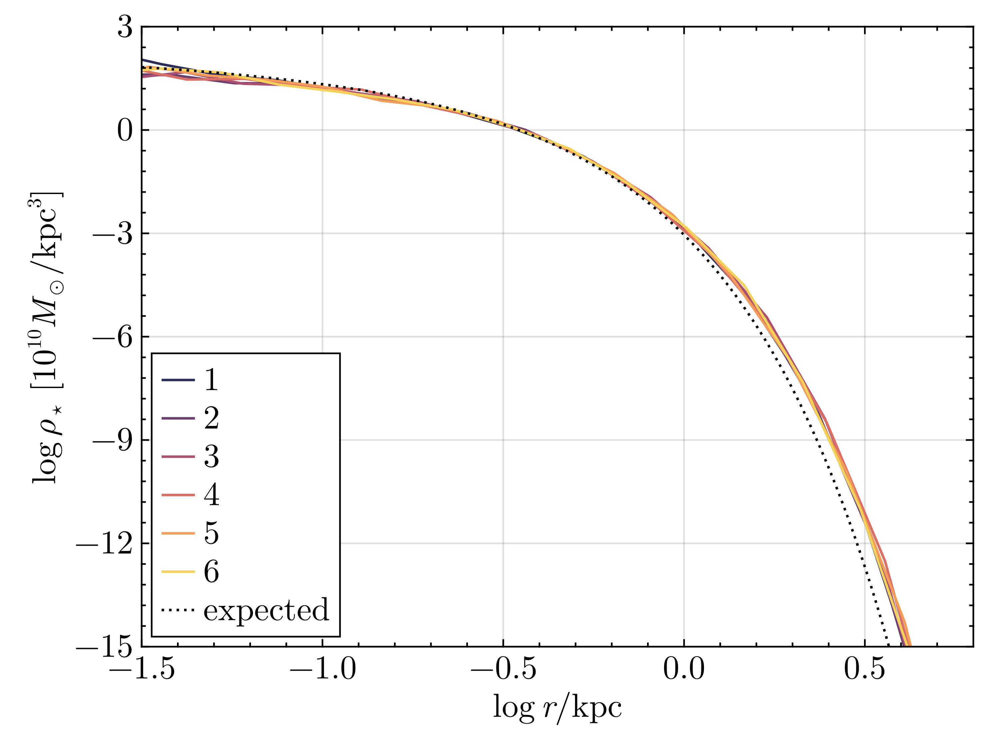

In [83]:
compare_profiles(profs, expected, sequential=true)

In [84]:
profs, expected = load_profiles(joinpath(model, "fiducial/stars_ana/exp2d_rs0.10"));

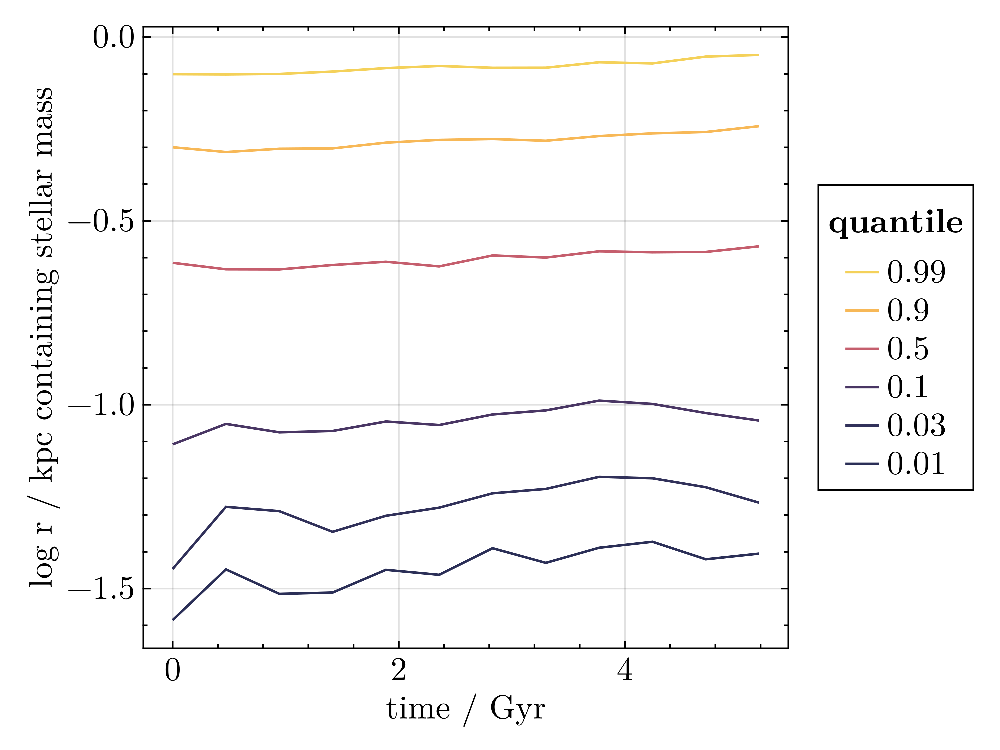

In [85]:
plot_r_percens(profs)

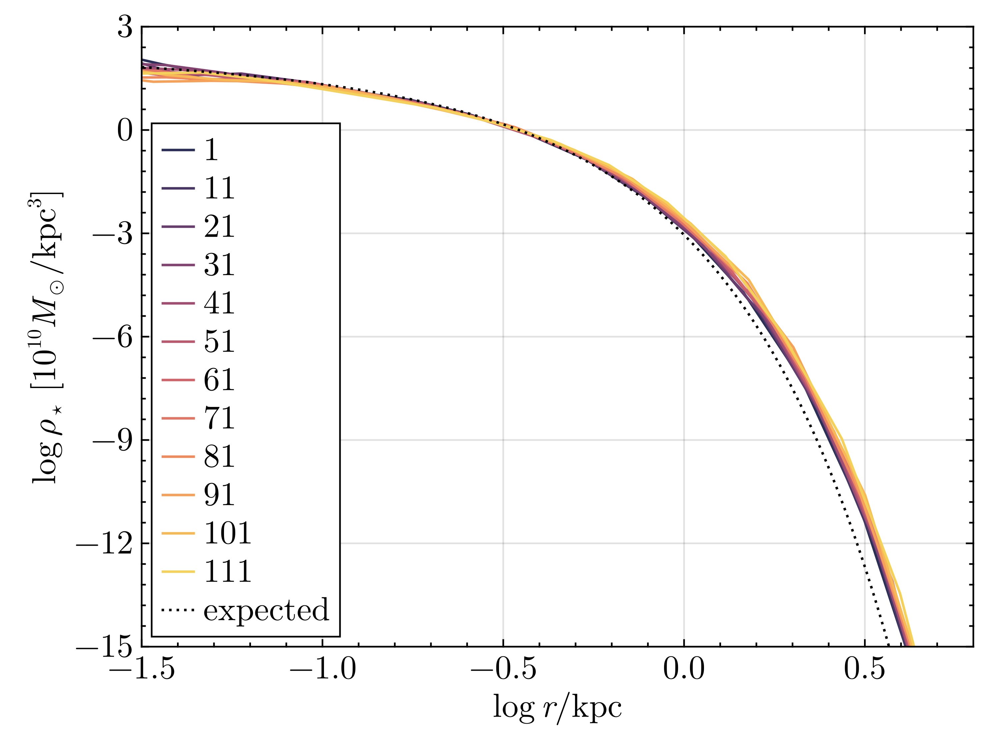

In [86]:
compare_profiles(profs, expected, sequential=true)

In [87]:
profs, expected = load_profiles(joinpath(model, "fiducial/stars/exp2d_rs0.10"));

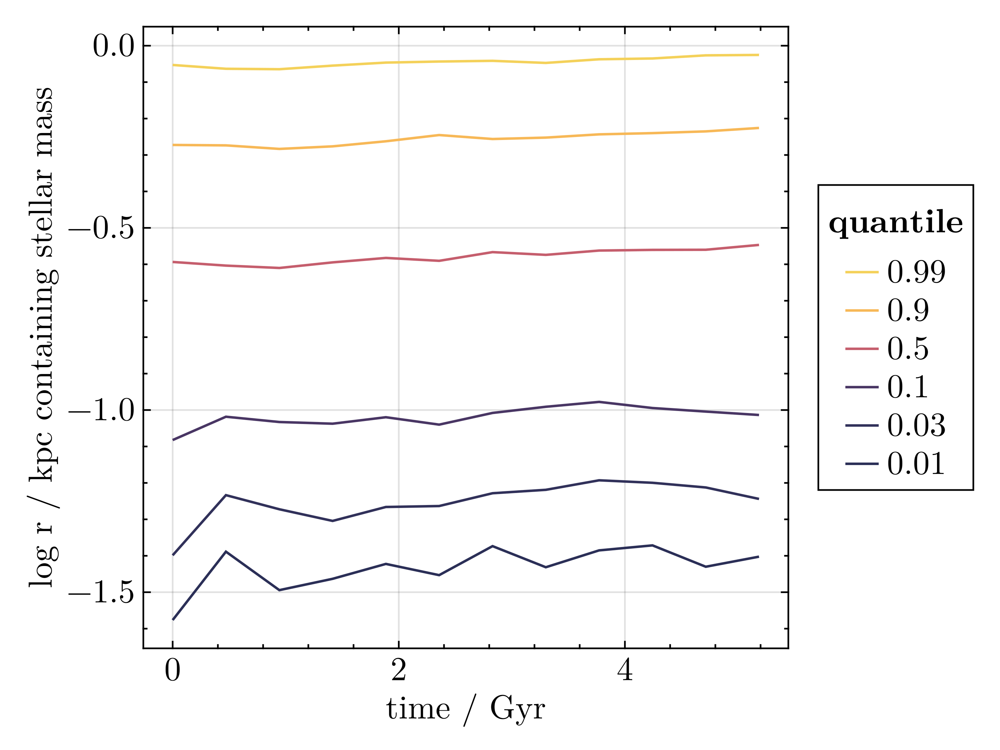

In [88]:
plot_r_percens(profs)

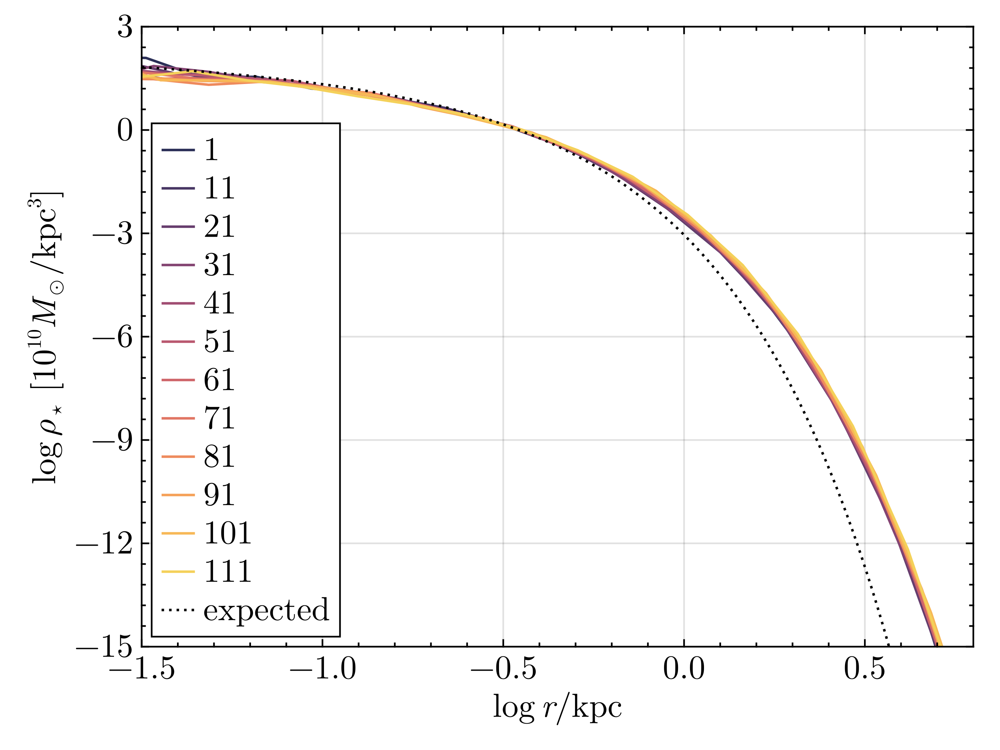

In [89]:
compare_profiles(profs, expected, sequential=true)

In [90]:
profs, expected = load_profiles(joinpath(model, "fiducial/stars_old/exp2d_rs0.10"));

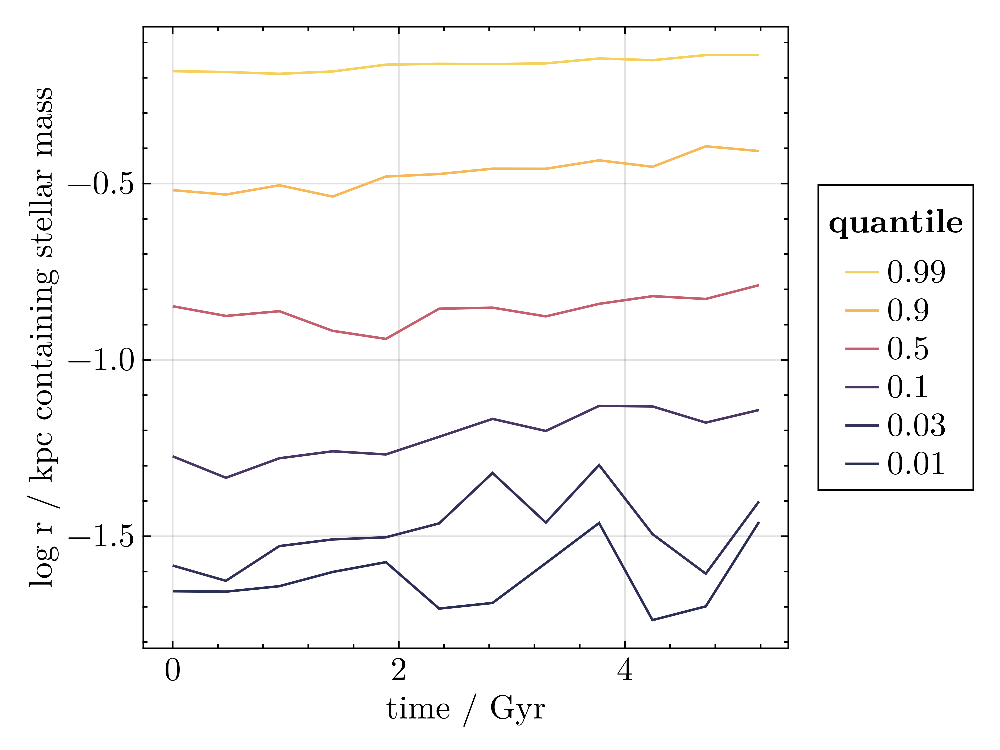

In [91]:
plot_r_percens(profs)

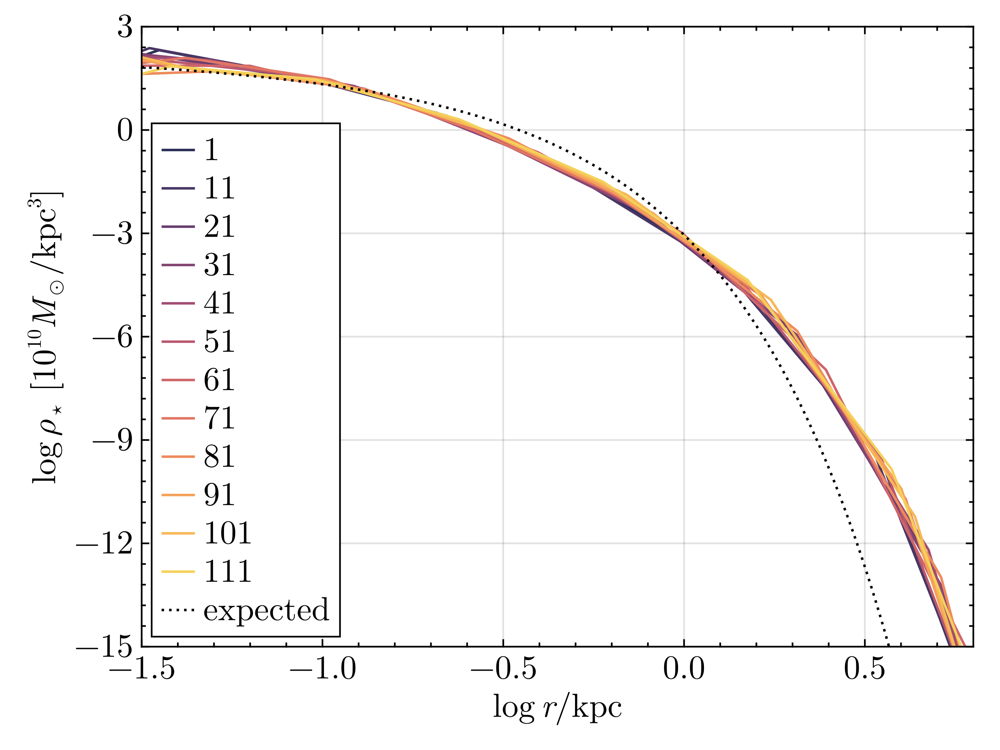

In [92]:
compare_profiles(profs, expected, sequential=true)

In [70]:
profs, expected = load_profiles(joinpath(model, "s0.014/stars/exp2d_rs0.10"));

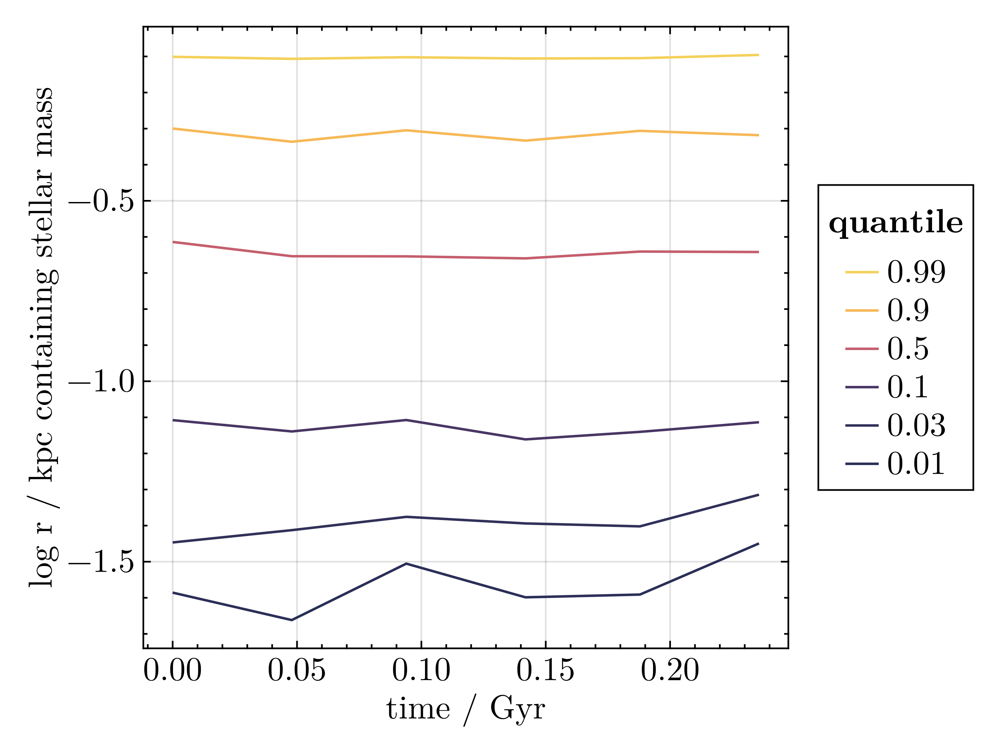

In [71]:
plot_r_percens(profs)

In [42]:
pos_profs, expected = load_profiles(joinpath(model, "fiducial/stars/exp2d_rs0.10"));

## Alternate halos

In [13]:
model = "sculptor/isolation/1e6/"

"sculptor/isolation/1e6/"

In [41]:
profs, expected = load_profiles(joinpath(model, "fiducial/stars_ana/exp2d_rs0.13"));

In [42]:
compact_profs, _ = load_profiles(joinpath(model, "V31_r3/stars/exp2d_rs0.10"));

In [37]:
all_profs = [
    "fiducial" => profs,
    "compact"  => compact_profs
    ];

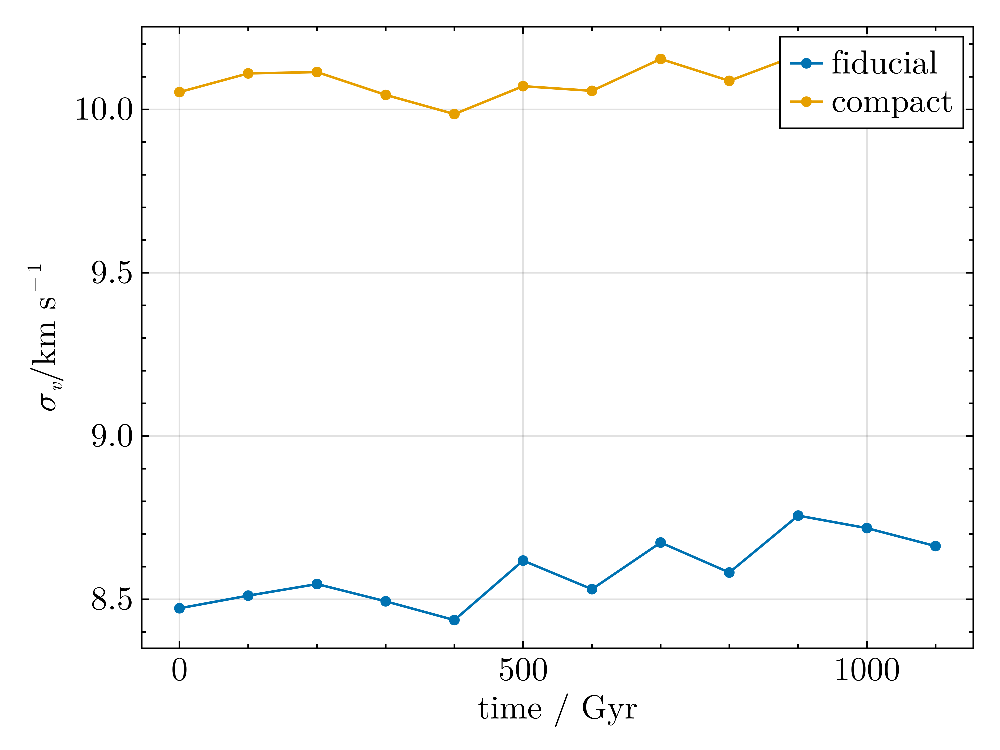

In [38]:
compare_v_t(all_profs)

In [39]:
all_profs_end = [
    "fiducial" => profs[end].second,
    "compact"  => compact_profs[end].second,
    ];

# Orbit studies

In [19]:
model = "sculptor/orbits/orbit1/1e6_V32_r5.4"

"sculptor/orbits/orbit1/1e6_V32_r5.4"

In [20]:
profs, expected = load_profiles(joinpath(model, "stars/king_rs0.15"), extension="_stellar_profiles_3d.hdf5");

In [1]:
profs2, expected2 = load_profiles(joinpath(model, "stars/king_rs0.15"), extension="_stellar_profiles_3d.hdf5");

LoadError: UndefVarError: `model` not defined

In [2]:
all_plots(profs, expected)

LoadError: UndefVarError: `all_plots` not defined

In [3]:
plot_v_t(profs)

LoadError: UndefVarError: `plot_v_t` not defined